In [36]:
import altair as alt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
alt.renderers.enable('mimetype')

RendererRegistry.enable('mimetype')

#### Load data and data cleaning

In [54]:
url = "https://open.canada.ca/data/dataset/92984c11-6fd4-40c4-b23c-e8832e1f4cd5/resource/148841f0-11c9-4f45-8700-d0a4717dea2f/download/capf_en.csv"
heritage = pd.read_csv(url, encoding="ISO-8859-1")
len(heritage)

1358

In [55]:
# data cleaning
heritage.columns = heritage.columns.str.lower().str.replace(" ", "_")
heritage = heritage.rename(columns={"grant_or_contributionution": "grant_or_contribution"})
heritage["audiences"] = heritage["audiences"].str.split(", ", expand=False)
heritage["disciplines"] = heritage["disciplines"].str.split(", ", expand=False)

#### Split the data

In [56]:
heritage_train, heritage_test = train_test_split(heritage, test_size=0.20, random_state=1233)

## EDA
- There are 13 columns, only 1 column is numeric
- `audiences` and `disciplines` columns contain lists of values and need to be processed before model building
- the `amount_approved` column is our target, and needs to be grouped into classes based on values.

In [57]:
heritage_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1086 entries, 798 to 101
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   fiscal_year            1086 non-null   object
 1   organization_name      1086 non-null   object
 2   project_name           1086 non-null   object
 3   city                   1086 non-null   object
 4   province               1086 non-null   object
 5   region                 1086 non-null   object
 6   community_type         1086 non-null   object
 7   grant_or_contribution  1086 non-null   object
 8   amount_approved        1086 non-null   int64 
 9   presenter_type         1086 non-null   object
 10  disciplines            1086 non-null   object
 11  audiences              1086 non-null   object
 12  project_sub_type       1086 non-null   object
 13  project_type           1086 non-null   object
dtypes: int64(1), object(13)
memory usage: 127.3+ KB


In [58]:
heritage_train.describe()

,amount_approved
count,1086.000000
mean,43713.622468
std,75981.314470
min,3000.000000
25%,12000.000000
50%,23000.000000
75%,50000.000000
max,1000000.000000


#### Create new column for classification

In [59]:
q10 = heritage_train["amount_approved"].quantile(0.1)
q25 = heritage_train["amount_approved"].quantile(0.25)
q50 = heritage_train["amount_approved"].quantile(0.5)
q75 = heritage_train["amount_approved"].quantile(0.75)

labeling = [f"${q75/1000}K",
            f"${q50/1000}K",
            f"${q25/1000}K",
            f"${q10/1000}K",
            f"less than ${q10/1000}K"]

amount = heritage_train["amount_approved"]
heritage_train["greater_than"] = np.where(amount > q75, labeling[0],
                                          np.where(amount > q50, labeling[1],
                                                   np.where(amount > q25, labeling[2],
                                                            np.where(amount > q10, labeling[3], labeling[4]))))

### Amount approved distribution

In [60]:
heritage_train.groupby("greater_than").count()["amount_approved"]

greater_than
$12.0K             266
$23.0K             288
$50.0K             250
$8.0K              161
less than $8.0K    121
Name: amount_approved, dtype: int64

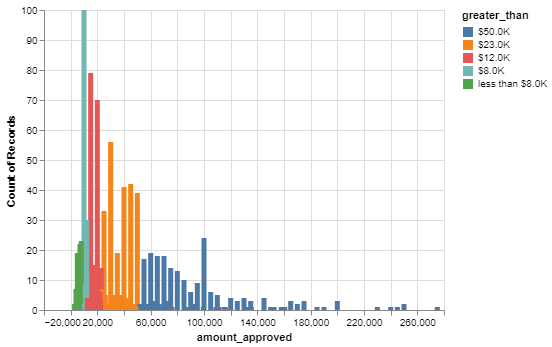

In [61]:
eda_heritage = (
    alt.Chart(heritage_train).mark_bar(clip=True).encode(
        alt.X("amount_approved", scale=alt.Scale(domain=(0, 260000))),
        alt.Y("count()"),
        alt.Color("greater_than", sort=labeling))
)
eda_heritage

### Counts of features

In [65]:
columns_eda = ['fiscal_year',
               'province',
               'region',
               'community_type',
               'grant_or_contribution',
               'presenter_type',
               'project_sub_type',
               'project_type']
columns_exploded = ["disciplines", "audiences"]

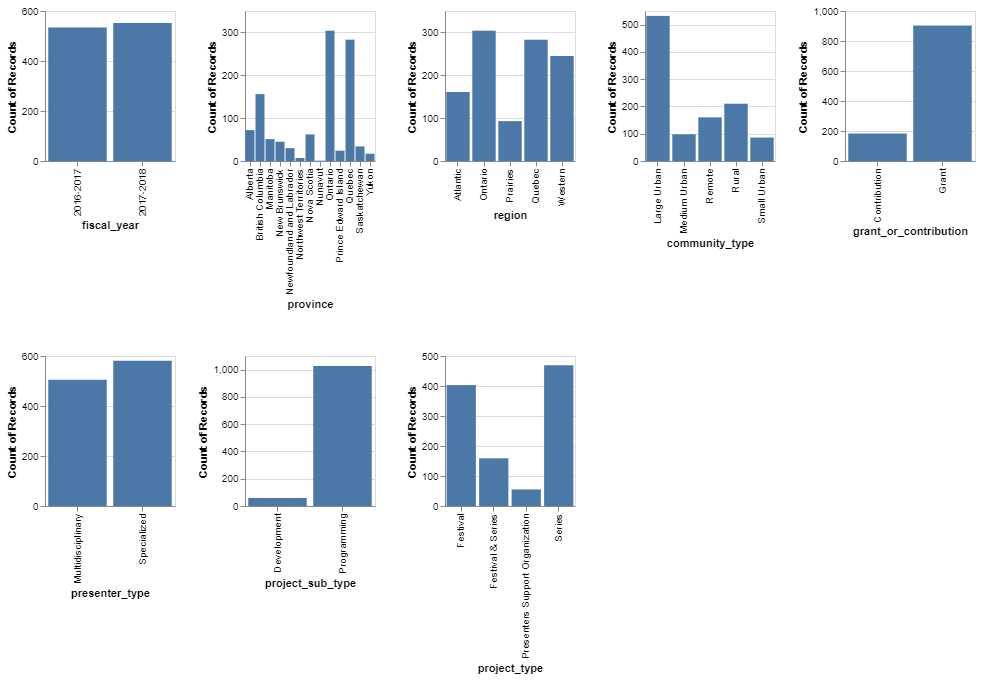

In [63]:
eda = (
    alt.Chart(heritage_train).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()", stack=False),)
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=5)
)
eda

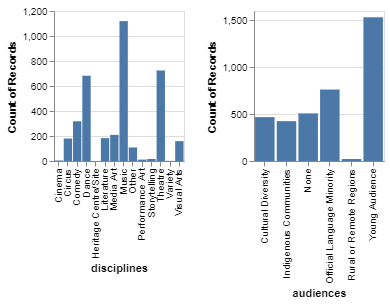

In [69]:
heritage_train_explode = heritage_train.explode("audiences").explode("disciplines")
eda_expl = (
    alt.Chart(heritage_train_explode).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()", stack=False),)
    .properties(width=130, height=150)
    .repeat(columns_exploded)
)
eda_expl

It should be noted that for these two features, an example can belong to multiple categories, so the counts contain repeats in the data.

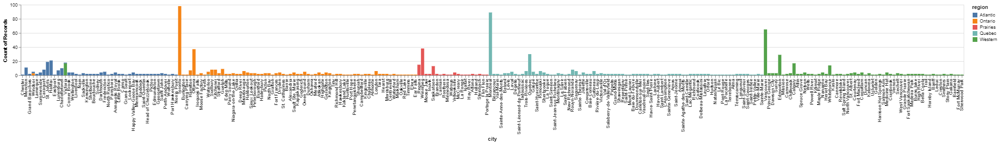

In [50]:
eda_city = (
    alt.Chart(heritage_train).mark_bar().encode(
        alt.X("city", sort="color"),
        alt.Y("count()"),
        alt.Color("region"))
    .properties(width=2000, height=150)
)
eda_city

### Features vs amount_approved

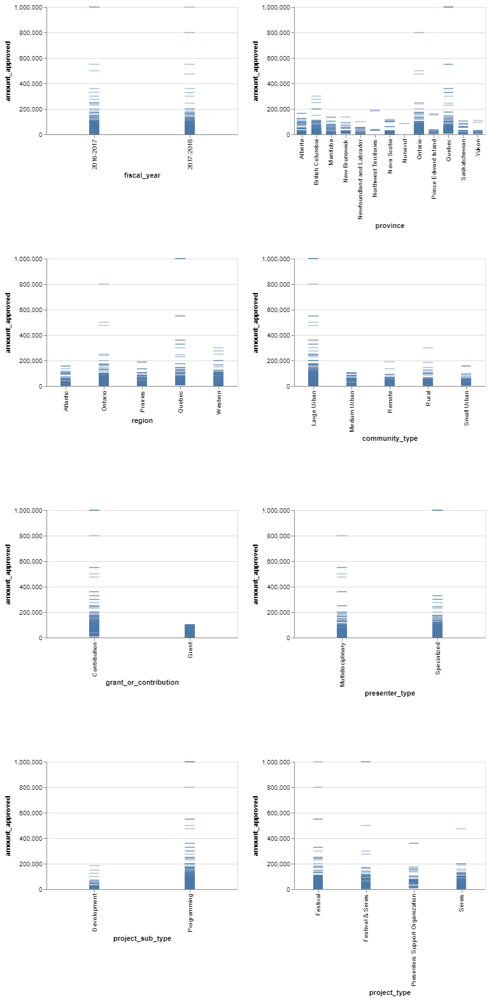

In [70]:
eda_vs_amt = (
    alt.Chart(heritage_train).mark_tick(width=15).encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("amount_approved"),)
    .properties(width=300, height=200)
    .repeat(columns_eda, columns=2)
)
eda_vs_amt

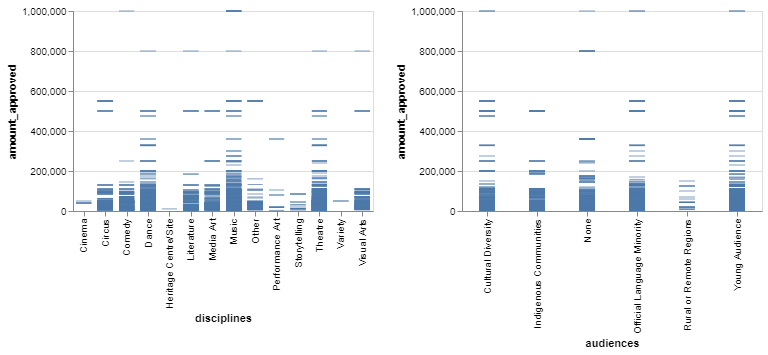

In [72]:
eda_vs_amt_expl = (
    alt.Chart(heritage_train_explode).mark_tick(width=15).encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("amount_approved"),)
    .properties(width=300, height=200)
    .repeat(columns_exploded, columns=2)
)
eda_vs_amt_expl

Again it should be noted that these two contain repeated data.

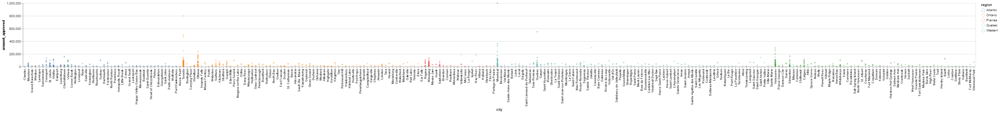

In [73]:
eda_city_vs_amt = (
    alt.Chart(heritage_train).mark_point(size=7, opacity=0.3).encode(
        alt.X("city", sort="color"),
        alt.Y("amount_approved"),
        alt.Color("region"))
    .properties(width=3000, height=200)
)
eda_city_vs_amt

### Feature counts with target categories

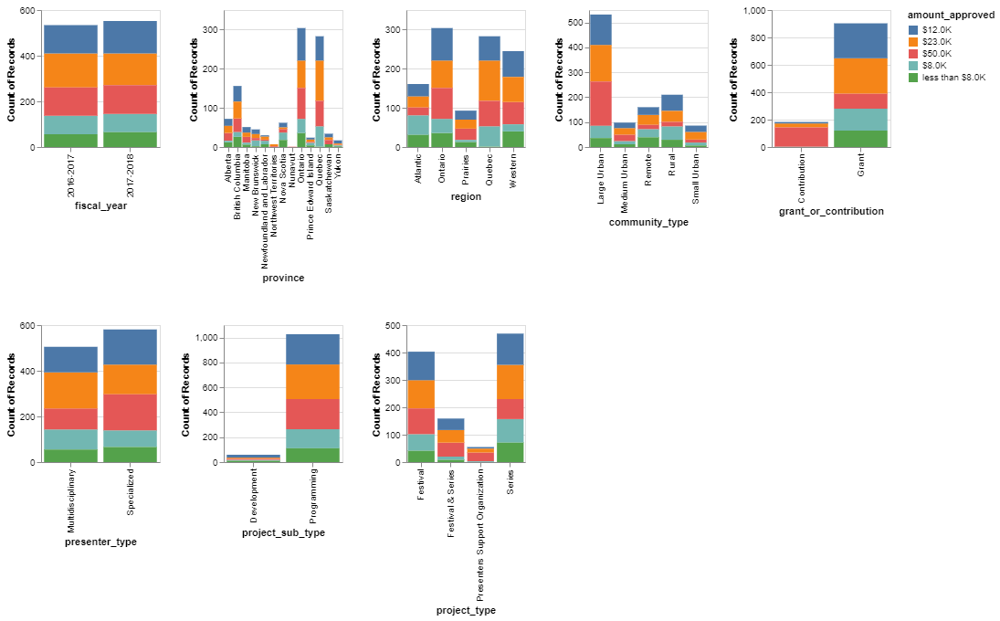

In [77]:
eda_cat = (
    alt.Chart(heritage_train).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()"),
        alt.Color("greater_than", title="amount_approved"))
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=5)
)
eda_cat

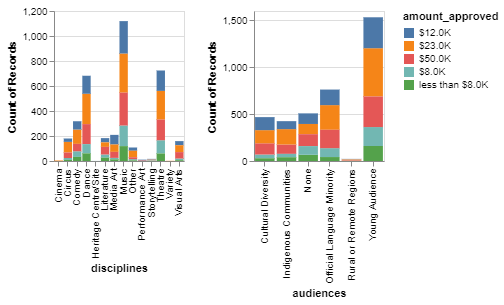

In [78]:
eda_cat = (
    alt.Chart(heritage_train_explode).mark_bar().encode(
        alt.X(alt.repeat(), type="ordinal"),
        alt.Y("count()"),
        alt.Color("greater_than", title="amount_approved"))
    .properties(width=130, height=150)
    .repeat(columns_exploded)
)
eda_cat

Again it should be noted that these two contain repeated data.